In [1]:
%load_ext autoreload

In [2]:
%autoreload 2

In [3]:
import os
import sys
module_path = os.path.abspath(os.path.join('..'))
if module_path not in sys.path:
    sys.path.append(module_path)

In [4]:
import networkit as nk
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import time

from sklearn.preprocessing import StandardScaler
from sklearn.decomposition import PCA
from sklearn.metrics import pairwise_distances
from IPython.display import display, Math, Latex, Markdown
from tqdm.notebook import tqdm
from numpy.linalg import norm

from External.ICT.calculate_ICT import calculate_ICT, compute_widths
from External.clustering import k_means_pp, centers
from External.generation import create_graph
from External.plotting import plot_points, plot_graph, no_intersections
from External.data_loader import data_loader
from External.ICT.reduce_to_mst import MST
from External.create_k_nearest import patch_together



plt.style.use('standard.mplstyle')

cv2 package not present. No movies possible


In [5]:
# Hyperparameters
mode = "K_Nearest+Density2"
metric = "euclidean"
dataset = "eth_CC"

threshold = 6

# for the filename
parameters = "2-0_5-t6"

In [6]:
start = time.time()

# load the dataset & UMAP embedding (if dim > 2, othervise embedding=position)
position, labels, embedding = data_loader(dataset, True)

# calculate the clusters
if len(position[0]) > 500:
    pca = PCA(n_components=100).fit_transform(StandardScaler().fit_transform(position))
else:
    pca = StandardScaler().fit_transform(position)

    
# Save the number of nodes (sometimes needed)
number_of_nodes = len(position)
    
# calculate the cluster centers and the components
ε, δ = 0.03, 0.1
r = 1 / (ε**2) * (int(np.log2(number_of_nodes - 1)) + 1 + np.log(1/δ))
k = int(np.sqrt(r))
k = np.min((k, number_of_nodes))    

cluster_centers, labels = k_means_pp(k, pca, metric=metric, return_labels=True)
unique_labels = np.unique(labels)


print("Time for data preperation: ", time.time()-start)

sklearn is done: 26.6064236164093
My own part is done: 1.1707193851470947
Time for data preperation:  88.93027353286743


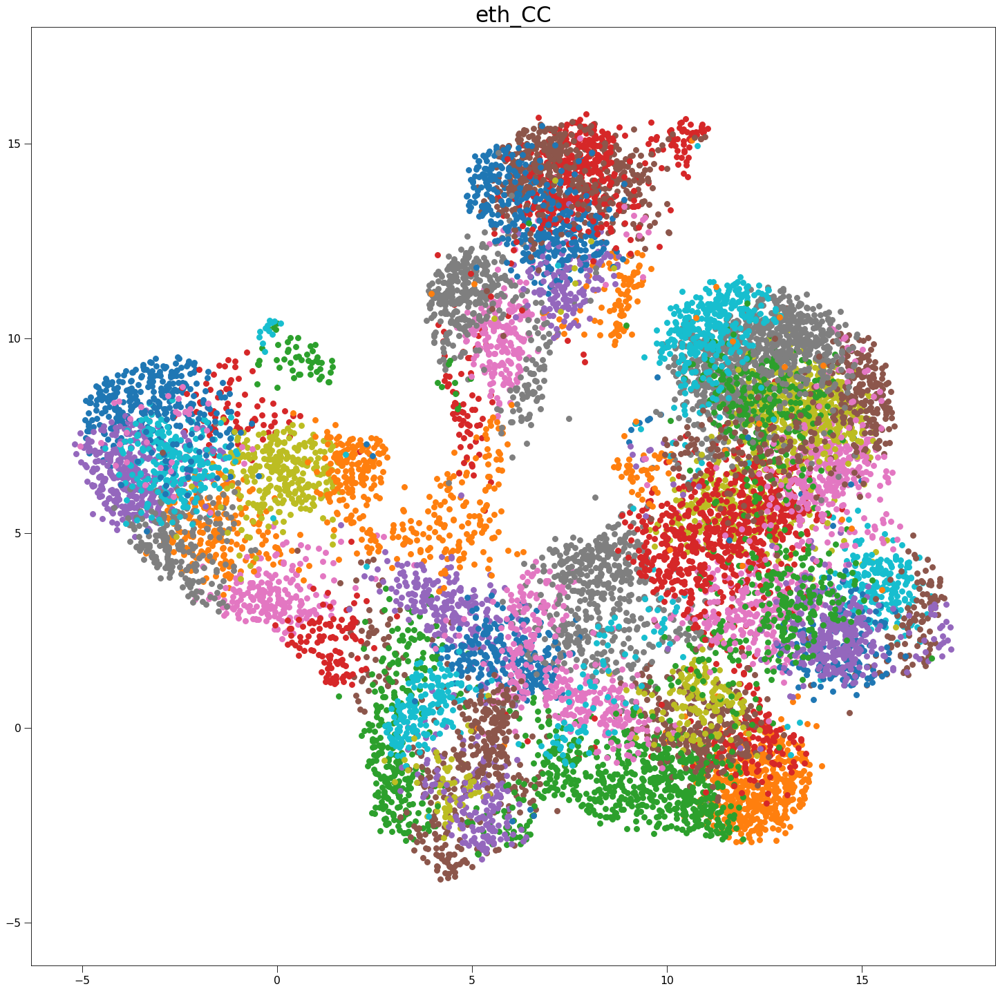

In [7]:
fig, ax = plt.subplots(1, figsize=(24,24))
plot_points(embedding, dataset, ax, labels)
ax.get_legend().remove()
plt.show()

In [8]:
components = []
node_labels = [None for _ in range(number_of_nodes)]
for label in np.sort(unique_labels):
    component = np.argwhere(label == labels).T
    assert len(component) == 1
    
    for node in component[0]:
        node_labels[node] = label
        
    components.append(component[0].tolist())

sub_ICTs = []

# Put the clusters with #nodes < threshold to the cluster of the nearest node
# PCA since clusters are computed in pca space!
distances = pairwise_distances(pca, pca)

cleaned_components = [False for _ in range(len(unique_labels))]

while True:
    
    for idx, component in enumerate(components):
        
        if cleaned_components[idx] == True:
            continue
        
        if len(component) <= threshold:
            
            for node in component:
                nearests = np.argsort(distances[node])
                for elem in nearests:
                    if elem not in component:
                        nearest = elem
                node_labels[node] = node_labels[nearest]
                components[node_labels[nearest]].append(node)
                cleaned_components[idx] = True
                continue
    
    break

new_components = []
new_node_labels = [None for _ in range(number_of_nodes)]
    
for idx, component in enumerate(components):
    if cleaned_components[idx] == False:
        new_components.append(component)
        for node in component:
            new_node_labels[node] = idx
            
unique_labels = np.unique(new_node_labels)
components = new_components
node_labels = new_node_labels



for component in tqdm(components):
    
    sub_number_of_nodes = len(component)
    
    sub_G, _ = create_graph(sub_number_of_nodes, mode, position=pca[component], k=4,
                            beta=2, delta=0.5, bridges=4)
    sub_G.indexEdges()

    sub_ICT = calculate_ICT(sub_G, algorithm_type="exact_own",
                                   zeros_stay_zeros=True, update_G=1.1)
    sub_ICT.indexEdges()
    sub_ICTs.append(sub_ICT)

  0%|          | 0/82 [00:00<?, ?it/s]

calculating the densities for the density criterion:   0%|          | 0/274 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1010 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1010 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1010 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/273 [00:00<?, ?it/s]

update Arr 1010 -> 907
added 2 edges early
update Arr 907 -> 814
added 3 edges early
update Arr 814 -> 727
added 3 edges early
update Arr 727 -> 660
update Arr 660 -> 597
update Arr 597 -> 542
update Arr 542 -> 490
update Arr 490 -> 442
update Arr 442 -> 398
update Arr 398 -> 361
update Arr 361 -> 319
update Arr 319 -> 279
added 9 edges early
update Arr 279 -> 279
update Arr 279 -> 278
update Arr 278 -> 278
update Arr 278 -> 276
update Arr 276 -> 275
update Arr 275 -> 275
update Arr 275 -> 274


calculating the densities for the density criterion:   0%|          | 0/29 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/99 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/99 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/99 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/28 [00:00<?, ?it/s]

update Arr 99 -> 88
update Arr 88 -> 78
update Arr 78 -> 70
update Arr 70 -> 51
update Arr 51 -> 46
update Arr 46 -> 41
update Arr 41 -> 37
update Arr 37 -> 35
update Arr 35 -> 33
update Arr 33 -> 31
update Arr 31 -> 31
update Arr 31 -> 30


calculating the densities for the density criterion:   0%|          | 0/224 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/799 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/799 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/799 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/223 [00:00<?, ?it/s]

update Arr 799 -> 726
added 5 edges early
update Arr 726 -> 657
update Arr 657 -> 595
update Arr 595 -> 536
update Arr 536 -> 486
update Arr 486 -> 440
update Arr 440 -> 399
update Arr 399 -> 360
update Arr 360 -> 327
update Arr 327 -> 297
update Arr 297 -> 268
update Arr 268 -> 243
update Arr 243 -> 233
update Arr 233 -> 229
update Arr 229 -> 229
update Arr 229 -> 228
update Arr 228 -> 227
update Arr 227 -> 226
update Arr 226 -> 225
update Arr 225 -> 224


calculating the densities for the density criterion:   0%|          | 0/203 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/738 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/738 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/738 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/202 [00:00<?, ?it/s]

update Arr 738 -> 666
added 2 edges early
update Arr 666 -> 600
update Arr 600 -> 537
added 2 edges early
update Arr 537 -> 484
added 3 edges early
update Arr 484 -> 439
update Arr 439 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 299
update Arr 299 -> 270
update Arr 270 -> 245
update Arr 245 -> 222
update Arr 222 -> 212
update Arr 212 -> 211
update Arr 211 -> 207
update Arr 207 -> 207
update Arr 207 -> 206
update Arr 206 -> 203
update Arr 203 -> 203


calculating the densities for the density criterion:   0%|          | 0/71 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/244 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/244 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/244 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/70 [00:00<?, ?it/s]

update Arr 244 -> 221
update Arr 221 -> 200
update Arr 200 -> 181
update Arr 181 -> 161
update Arr 161 -> 146
update Arr 146 -> 132
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 97
update Arr 97 -> 87
update Arr 87 -> 80
update Arr 80 -> 79
update Arr 79 -> 75
update Arr 75 -> 74
update Arr 74 -> 73
update Arr 73 -> 72
update Arr 72 -> 72
update Arr 72 -> 71


calculating the densities for the density criterion:   0%|          | 0/151 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/534 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/534 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/534 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/150 [00:00<?, ?it/s]

update Arr 534 -> 479
added 4 edges early
update Arr 479 -> 428
update Arr 428 -> 386
update Arr 386 -> 346
added 4 edges early
update Arr 346 -> 313
update Arr 313 -> 284
update Arr 284 -> 258
update Arr 258 -> 232
update Arr 232 -> 209
update Arr 209 -> 189
update Arr 189 -> 169
update Arr 169 -> 157
update Arr 157 -> 156
update Arr 156 -> 154
update Arr 154 -> 153
update Arr 153 -> 152
update Arr 152 -> 151


calculating the densities for the density criterion:   0%|          | 0/217 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/821 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/821 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/821 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/216 [00:00<?, ?it/s]

update Arr 821 -> 733
added 7 edges early
update Arr 733 -> 659
update Arr 659 -> 598
update Arr 598 -> 536
update Arr 536 -> 487
update Arr 487 -> 441
update Arr 441 -> 400
update Arr 400 -> 362
update Arr 362 -> 328
update Arr 328 -> 297
update Arr 297 -> 268
update Arr 268 -> 243
update Arr 243 -> 225
update Arr 225 -> 224
update Arr 224 -> 218
added 2 edges early
update Arr 218 -> 218
update Arr 218 -> 217
update Arr 217 -> 216


calculating the densities for the density criterion:   0%|          | 0/421 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1587 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1587 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1587 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/420 [00:00<?, ?it/s]

update Arr 1587 -> 1436
added 7 edges early
update Arr 1436 -> 1294
added 3 edges early
update Arr 1294 -> 1174
added 2 edges early
update Arr 1174 -> 1067
update Arr 1067 -> 968
update Arr 968 -> 879
update Arr 879 -> 799
update Arr 799 -> 725
update Arr 725 -> 658
update Arr 658 -> 598
update Arr 598 -> 542
update Arr 542 -> 492
update Arr 492 -> 446
update Arr 446 -> 423
added 7 edges early
update Arr 423 -> 423
update Arr 423 -> 422
update Arr 422 -> 421


calculating the densities for the density criterion:   0%|          | 0/75 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/258 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/258 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/258 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/74 [00:00<?, ?it/s]

update Arr 258 -> 230
update Arr 230 -> 209
update Arr 209 -> 178
added 3 edges early
update Arr 178 -> 160
update Arr 160 -> 143
update Arr 143 -> 128
update Arr 128 -> 113
update Arr 113 -> 99
update Arr 99 -> 85
added 3 edges early
update Arr 85 -> 83
update Arr 83 -> 78
update Arr 78 -> 78
update Arr 78 -> 77
update Arr 77 -> 76
update Arr 76 -> 74


calculating the densities for the density criterion:   0%|          | 0/189 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/698 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/698 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/698 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/188 [00:00<?, ?it/s]

update Arr 698 -> 630
added 4 edges early
update Arr 630 -> 564
update Arr 564 -> 511
added 4 edges early
update Arr 511 -> 464
update Arr 464 -> 420
update Arr 420 -> 380
update Arr 380 -> 342
update Arr 342 -> 292
update Arr 292 -> 265
update Arr 265 -> 239
update Arr 239 -> 217
update Arr 217 -> 189
added 7 edges early
update Arr 189 -> 189
update Arr 189 -> 188


calculating the densities for the density criterion:   0%|          | 0/19 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/64 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/64 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/64 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/18 [00:00<?, ?it/s]

update Arr 64 -> 57
update Arr 57 -> 51
update Arr 51 -> 42
update Arr 42 -> 38
update Arr 38 -> 33
update Arr 33 -> 27
update Arr 27 -> 25
update Arr 25 -> 21
update Arr 21 -> 20
update Arr 20 -> 19


calculating the densities for the density criterion:   0%|          | 0/165 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/623 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/623 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/623 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/164 [00:00<?, ?it/s]

update Arr 623 -> 566
added 4 edges early
update Arr 566 -> 511
update Arr 511 -> 462
added 2 edges early
update Arr 462 -> 419
added 2 edges early
update Arr 419 -> 373
update Arr 373 -> 338
update Arr 338 -> 307
update Arr 307 -> 279
update Arr 279 -> 253
update Arr 253 -> 228
update Arr 228 -> 206
update Arr 206 -> 187
update Arr 187 -> 174
update Arr 174 -> 174
update Arr 174 -> 173
update Arr 173 -> 172
update Arr 172 -> 169
update Arr 169 -> 168
update Arr 168 -> 167
update Arr 167 -> 166
update Arr 166 -> 165


calculating the densities for the density criterion:   0%|          | 0/253 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/943 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/943 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/943 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/252 [00:00<?, ?it/s]

update Arr 943 -> 849
added 3 edges early
update Arr 849 -> 771
update Arr 771 -> 695
added 2 edges early
update Arr 695 -> 628
added 5 edges early
update Arr 628 -> 570
update Arr 570 -> 517
update Arr 517 -> 465
update Arr 465 -> 421
update Arr 421 -> 381
update Arr 381 -> 346
update Arr 346 -> 314
update Arr 314 -> 284
update Arr 284 -> 262
update Arr 262 -> 261
update Arr 261 -> 260
update Arr 260 -> 259
update Arr 259 -> 258
update Arr 258 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 254
update Arr 254 -> 253


calculating the densities for the density criterion:   0%|          | 0/271 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1009 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1009 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1009 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/270 [00:00<?, ?it/s]

update Arr 1009 -> 916
added 6 edges early
update Arr 916 -> 832
update Arr 832 -> 753
update Arr 753 -> 683
update Arr 683 -> 620
update Arr 620 -> 562
update Arr 562 -> 509
update Arr 509 -> 460
update Arr 460 -> 418
update Arr 418 -> 378
update Arr 378 -> 343
update Arr 343 -> 311
update Arr 311 -> 281
update Arr 281 -> 280
update Arr 280 -> 279
update Arr 279 -> 278
update Arr 278 -> 276
update Arr 276 -> 271
added 4 edges early
update Arr 271 -> 271


calculating the densities for the density criterion:   0%|          | 0/162 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/561 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/561 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/561 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/161 [00:00<?, ?it/s]

update Arr 561 -> 508
added 2 edges early
update Arr 508 -> 458
update Arr 458 -> 414
update Arr 414 -> 376
update Arr 376 -> 341
update Arr 341 -> 308
update Arr 308 -> 278
update Arr 278 -> 252
update Arr 252 -> 228
update Arr 228 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 168
update Arr 168 -> 164
update Arr 164 -> 164
update Arr 164 -> 163


calculating the densities for the density criterion:   0%|          | 0/207 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/773 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/773 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/773 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/206 [00:00<?, ?it/s]

update Arr 773 -> 700
added 6 edges early
update Arr 700 -> 633
update Arr 633 -> 575
update Arr 575 -> 519
update Arr 519 -> 471
update Arr 471 -> 428
update Arr 428 -> 389
update Arr 389 -> 352
update Arr 352 -> 319
update Arr 319 -> 289
update Arr 289 -> 260
update Arr 260 -> 235
update Arr 235 -> 215
update Arr 215 -> 214
update Arr 214 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 208
update Arr 208 -> 207


calculating the densities for the density criterion:   0%|          | 0/346 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1265 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1265 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1265 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/345 [00:00<?, ?it/s]

update Arr 1265 -> 1143
added 5 edges early
update Arr 1143 -> 1031
added 2 edges early
update Arr 1031 -> 934
added 3 edges early
update Arr 934 -> 849
update Arr 849 -> 769
update Arr 769 -> 698
update Arr 698 -> 634
update Arr 634 -> 576
update Arr 576 -> 522
update Arr 522 -> 473
update Arr 473 -> 429
update Arr 429 -> 389
update Arr 389 -> 355
update Arr 355 -> 354
update Arr 354 -> 352
update Arr 352 -> 351
update Arr 351 -> 350
update Arr 350 -> 348
update Arr 348 -> 347
update Arr 347 -> 346


calculating the densities for the density criterion:   0%|          | 0/117 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/429 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/429 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/429 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/116 [00:00<?, ?it/s]

update Arr 429 -> 389
added 2 edges early
update Arr 389 -> 338
update Arr 338 -> 306
update Arr 306 -> 266
update Arr 266 -> 241
update Arr 241 -> 217
update Arr 217 -> 195
update Arr 195 -> 176
update Arr 176 -> 159
update Arr 159 -> 143
update Arr 143 -> 128
update Arr 128 -> 124
update Arr 124 -> 124
update Arr 124 -> 122
update Arr 122 -> 121
update Arr 121 -> 119
update Arr 119 -> 118
update Arr 118 -> 117


calculating the densities for the density criterion:   0%|          | 0/9 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/26 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/26 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/26 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/8 [00:00<?, ?it/s]

update Arr 26 -> 23
update Arr 23 -> 20
update Arr 20 -> 15
update Arr 15 -> 13
update Arr 13 -> 11
update Arr 11 -> 10
update Arr 10 -> 9


calculating the densities for the density criterion:   0%|          | 0/353 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1324 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1324 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1324 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/352 [00:00<?, ?it/s]

update Arr 1324 -> 1189
update Arr 1189 -> 1079
update Arr 1079 -> 975
added 4 edges early
update Arr 975 -> 886
added 6 edges early
update Arr 886 -> 805
update Arr 805 -> 730
update Arr 730 -> 661
update Arr 661 -> 599
update Arr 599 -> 543
update Arr 543 -> 492
update Arr 492 -> 446
update Arr 446 -> 405
update Arr 405 -> 368
update Arr 368 -> 354
added 4 edges early
update Arr 354 -> 354
update Arr 354 -> 353
update Arr 353 -> 353
update Arr 353 -> 352


calculating the densities for the density criterion:   0%|          | 0/196 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/714 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/714 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/714 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/195 [00:00<?, ?it/s]

update Arr 714 -> 648
added 3 edges early
update Arr 648 -> 588
update Arr 588 -> 532
added 2 edges early
update Arr 532 -> 481
added 2 edges early
update Arr 481 -> 437
update Arr 437 -> 397
update Arr 397 -> 359
update Arr 359 -> 325
update Arr 325 -> 294
update Arr 294 -> 267
update Arr 267 -> 242
update Arr 242 -> 219
update Arr 219 -> 198
added 4 edges early
update Arr 198 -> 198
update Arr 198 -> 197
update Arr 197 -> 196


calculating the densities for the density criterion:   0%|          | 0/79 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/285 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/285 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/285 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 285 -> 244
added 4 edges early
update Arr 244 -> 220
update Arr 220 -> 193
added 3 edges early
update Arr 193 -> 167
added 3 edges early
update Arr 167 -> 142
added 5 edges early
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 104
update Arr 104 -> 82
added 13 edges early
update Arr 82 -> 81
update Arr 81 -> 81
update Arr 81 -> 80
update Arr 80 -> 80
update Arr 80 -> 78


calculating the densities for the density criterion:   0%|          | 0/93 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/313 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/313 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/313 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/92 [00:00<?, ?it/s]

update Arr 313 -> 282
update Arr 282 -> 256
update Arr 256 -> 231
update Arr 231 -> 207
update Arr 207 -> 188
update Arr 188 -> 170
update Arr 170 -> 153
update Arr 153 -> 138
update Arr 138 -> 125
update Arr 125 -> 110
update Arr 110 -> 101
update Arr 101 -> 98
update Arr 98 -> 97
update Arr 97 -> 94
update Arr 94 -> 94
update Arr 94 -> 93
update Arr 93 -> 93


calculating the densities for the density criterion:   0%|          | 0/46 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/160 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/160 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/160 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/45 [00:00<?, ?it/s]

update Arr 160 -> 139
update Arr 139 -> 118
update Arr 118 -> 107
update Arr 107 -> 95
update Arr 95 -> 85
update Arr 85 -> 76
update Arr 76 -> 67
update Arr 67 -> 59
update Arr 59 -> 54
update Arr 54 -> 53
update Arr 53 -> 47
added 3 edges early
update Arr 47 -> 47


calculating the densities for the density criterion:   0%|          | 0/130 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/469 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/469 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/469 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/129 [00:00<?, ?it/s]

update Arr 469 -> 426
added 2 edges early
update Arr 426 -> 385
update Arr 385 -> 347
update Arr 347 -> 315
update Arr 315 -> 285
update Arr 285 -> 258
update Arr 258 -> 233
update Arr 233 -> 210
update Arr 210 -> 188
update Arr 188 -> 170
update Arr 170 -> 154
update Arr 154 -> 139
update Arr 139 -> 135
update Arr 135 -> 135
update Arr 135 -> 134
update Arr 134 -> 133
update Arr 133 -> 133
update Arr 133 -> 132
update Arr 132 -> 131


calculating the densities for the density criterion:   0%|          | 0/141 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/515 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/515 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/515 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/140 [00:00<?, ?it/s]

update Arr 515 -> 453
added 7 edges early
update Arr 453 -> 408
update Arr 408 -> 368
update Arr 368 -> 334
update Arr 334 -> 303
update Arr 303 -> 275
update Arr 275 -> 248
update Arr 248 -> 223
update Arr 223 -> 202
update Arr 202 -> 182
update Arr 182 -> 164
update Arr 164 -> 148
update Arr 148 -> 148
update Arr 148 -> 147
update Arr 147 -> 147
update Arr 147 -> 145
update Arr 145 -> 145
update Arr 145 -> 143
update Arr 143 -> 142


calculating the densities for the density criterion:   0%|          | 0/60 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/206 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/206 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/206 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/59 [00:00<?, ?it/s]

update Arr 206 -> 182
added 2 edges early
update Arr 182 -> 164
update Arr 164 -> 143
update Arr 143 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 94
update Arr 94 -> 85
update Arr 85 -> 77
update Arr 77 -> 69
update Arr 69 -> 63
update Arr 63 -> 63
update Arr 63 -> 62
update Arr 62 -> 61
update Arr 61 -> 60
update Arr 60 -> 60


calculating the densities for the density criterion:   0%|          | 0/70 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/249 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/249 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/249 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/69 [00:00<?, ?it/s]

update Arr 249 -> 225
update Arr 225 -> 196
update Arr 196 -> 176
update Arr 176 -> 157
update Arr 157 -> 142
update Arr 142 -> 129
update Arr 129 -> 117
update Arr 117 -> 105
update Arr 105 -> 93
update Arr 93 -> 84
update Arr 84 -> 79
update Arr 79 -> 76
update Arr 76 -> 75
update Arr 75 -> 73
update Arr 73 -> 73
update Arr 73 -> 71
update Arr 71 -> 70


calculating the densities for the density criterion:   0%|          | 0/234 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/829 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/829 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/829 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/233 [00:00<?, ?it/s]

update Arr 829 -> 745
added 7 edges early
update Arr 745 -> 675
update Arr 675 -> 608
update Arr 608 -> 546
added 3 edges early
update Arr 546 -> 495
update Arr 495 -> 447
update Arr 447 -> 406
update Arr 406 -> 369
update Arr 369 -> 335
update Arr 335 -> 302
update Arr 302 -> 274
update Arr 274 -> 249
update Arr 249 -> 242
update Arr 242 -> 240
update Arr 240 -> 239
update Arr 239 -> 238
update Arr 238 -> 236
update Arr 236 -> 235
update Arr 235 -> 234


calculating the densities for the density criterion:   0%|          | 0/194 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/722 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/722 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/722 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/193 [00:00<?, ?it/s]

update Arr 722 -> 654
added 4 edges early
update Arr 654 -> 593
update Arr 593 -> 539
update Arr 539 -> 487
update Arr 487 -> 441
update Arr 441 -> 400
update Arr 400 -> 361
update Arr 361 -> 328
update Arr 328 -> 298
update Arr 298 -> 267
update Arr 267 -> 241
update Arr 241 -> 218
update Arr 218 -> 203
update Arr 203 -> 201
update Arr 201 -> 200
update Arr 200 -> 199
update Arr 199 -> 198
update Arr 198 -> 197
update Arr 197 -> 196
update Arr 196 -> 195
update Arr 195 -> 194


calculating the densities for the density criterion:   0%|          | 0/10 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/28 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/28 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/28 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/9 [00:00<?, ?it/s]

update Arr 28 -> 25
update Arr 25 -> 22
update Arr 22 -> 17
update Arr 17 -> 13
update Arr 13 -> 11
update Arr 11 -> 10
update Arr 10 -> 9


calculating the densities for the density criterion:   0%|          | 0/50 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/174 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/174 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/174 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/49 [00:00<?, ?it/s]

update Arr 174 -> 144
update Arr 144 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 95
update Arr 95 -> 85
update Arr 85 -> 77
update Arr 77 -> 68
update Arr 68 -> 61
update Arr 61 -> 58
update Arr 58 -> 56
update Arr 56 -> 53
update Arr 53 -> 53
update Arr 53 -> 51


calculating the densities for the density criterion:   0%|          | 0/286 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1081 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1081 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1081 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/285 [00:00<?, ?it/s]

update Arr 1081 -> 978
added 7 edges early
update Arr 978 -> 884
update Arr 884 -> 791
update Arr 791 -> 719
added 2 edges early
update Arr 719 -> 653
update Arr 653 -> 593
update Arr 593 -> 538
update Arr 538 -> 488
update Arr 488 -> 443
update Arr 443 -> 402
update Arr 402 -> 365
update Arr 365 -> 331
update Arr 331 -> 300
update Arr 300 -> 287
added 6 edges early
update Arr 287 -> 287
update Arr 287 -> 286
update Arr 286 -> 286


calculating the densities for the density criterion:   0%|          | 0/260 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/959 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/959 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/959 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/259 [00:00<?, ?it/s]

update Arr 959 -> 851
added 6 edges early
update Arr 851 -> 762
added 3 edges early
update Arr 762 -> 691
added 3 edges early
update Arr 691 -> 628
update Arr 628 -> 570
update Arr 570 -> 518
update Arr 518 -> 467
update Arr 467 -> 423
update Arr 423 -> 383
update Arr 383 -> 347
update Arr 347 -> 315
update Arr 315 -> 280
added 2 edges early
update Arr 280 -> 267
added 3 edges early
update Arr 267 -> 267
update Arr 267 -> 266
update Arr 266 -> 264
update Arr 264 -> 264
update Arr 264 -> 263
update Arr 263 -> 262
update Arr 262 -> 261


calculating the densities for the density criterion:   0%|          | 0/257 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/956 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/956 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/956 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/256 [00:00<?, ?it/s]

update Arr 956 -> 867
added 2 edges early
update Arr 867 -> 786
update Arr 786 -> 711
added 2 edges early
update Arr 711 -> 628
added 4 edges early
update Arr 628 -> 570
update Arr 570 -> 518
update Arr 518 -> 469
update Arr 469 -> 425
update Arr 425 -> 386
update Arr 386 -> 349
update Arr 349 -> 315
update Arr 315 -> 285
update Arr 285 -> 262
added 5 edges early
update Arr 262 -> 262
update Arr 262 -> 261
update Arr 261 -> 260
update Arr 260 -> 259
update Arr 259 -> 258
update Arr 258 -> 257


calculating the densities for the density criterion:   0%|          | 0/62 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/225 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 225 -> 204
added 2 edges early
update Arr 204 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 132
added 2 edges early
update Arr 132 -> 118
update Arr 118 -> 107
update Arr 107 -> 94
update Arr 94 -> 84
update Arr 84 -> 75
update Arr 75 -> 66
added 3 edges early
update Arr 66 -> 66
update Arr 66 -> 66
update Arr 66 -> 65
update Arr 65 -> 64
update Arr 64 -> 63
update Arr 63 -> 62


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/378 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/378 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/378 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 378 -> 341
update Arr 341 -> 309
update Arr 309 -> 271
update Arr 271 -> 245
update Arr 245 -> 221
update Arr 221 -> 197
update Arr 197 -> 178
update Arr 178 -> 159
update Arr 159 -> 144
update Arr 144 -> 130
update Arr 130 -> 122
update Arr 122 -> 121
update Arr 121 -> 120
update Arr 120 -> 119
update Arr 119 -> 116
update Arr 116 -> 116
update Arr 116 -> 115
update Arr 115 -> 112


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/266 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/266 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/266 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 266 -> 238
update Arr 238 -> 214
update Arr 214 -> 179
added 2 edges early
update Arr 179 -> 161
update Arr 161 -> 145
update Arr 145 -> 131
update Arr 131 -> 119
update Arr 119 -> 106
update Arr 106 -> 93
update Arr 93 -> 84
update Arr 84 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 80


calculating the densities for the density criterion:   0%|          | 0/177 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/641 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/641 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/641 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/176 [00:00<?, ?it/s]

update Arr 641 -> 581
added 2 edges early
update Arr 581 -> 528
added 2 edges early
update Arr 528 -> 473
update Arr 473 -> 429
update Arr 429 -> 389
update Arr 389 -> 352
update Arr 352 -> 318
update Arr 318 -> 289
update Arr 289 -> 262
update Arr 262 -> 235
update Arr 235 -> 212
update Arr 212 -> 192
update Arr 192 -> 184
added 2 edges early
update Arr 184 -> 184
update Arr 184 -> 183
update Arr 183 -> 182
update Arr 182 -> 181
update Arr 181 -> 180
update Arr 180 -> 180
update Arr 180 -> 179
update Arr 179 -> 178
update Arr 178 -> 177


calculating the densities for the density criterion:   0%|          | 0/13 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/39 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/39 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/39 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/12 [00:00<?, ?it/s]

update Arr 39 -> 33
update Arr 33 -> 25
update Arr 25 -> 22
update Arr 22 -> 20
update Arr 20 -> 17
update Arr 17 -> 15
update Arr 15 -> 13
update Arr 13 -> 12


calculating the densities for the density criterion:   0%|          | 0/32 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/112 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/112 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/112 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/31 [00:00<?, ?it/s]

update Arr 112 -> 95
update Arr 95 -> 83
update Arr 83 -> 65
update Arr 65 -> 58
update Arr 58 -> 52
update Arr 52 -> 47
update Arr 47 -> 38
update Arr 38 -> 37
update Arr 37 -> 35
update Arr 35 -> 34
update Arr 34 -> 33
update Arr 33 -> 32


calculating the densities for the density criterion:   0%|          | 0/98 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/322 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/322 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/322 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/97 [00:00<?, ?it/s]

update Arr 322 -> 290
update Arr 290 -> 262
update Arr 262 -> 238
update Arr 238 -> 216
update Arr 216 -> 194
update Arr 194 -> 175
update Arr 175 -> 158
update Arr 158 -> 142
update Arr 142 -> 128
update Arr 128 -> 115
update Arr 115 -> 106
update Arr 106 -> 104
update Arr 104 -> 102
update Arr 102 -> 102
update Arr 102 -> 100
update Arr 100 -> 99


calculating the densities for the density criterion:   0%|          | 0/62 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/215 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/215 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/215 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/61 [00:00<?, ?it/s]

update Arr 215 -> 193
added 2 edges early
update Arr 193 -> 168
update Arr 168 -> 151
update Arr 151 -> 136
update Arr 136 -> 123
update Arr 123 -> 110
update Arr 110 -> 98
update Arr 98 -> 89
update Arr 89 -> 77
update Arr 77 -> 69
update Arr 69 -> 68
update Arr 68 -> 64
update Arr 64 -> 64
update Arr 64 -> 63
update Arr 63 -> 62


calculating the densities for the density criterion:   0%|          | 0/358 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1365 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1365 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1365 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/357 [00:00<?, ?it/s]

update Arr 1365 -> 1230
added 7 edges early
update Arr 1230 -> 1117
update Arr 1117 -> 1014
added 5 edges early
update Arr 1014 -> 921
update Arr 921 -> 835
update Arr 835 -> 758
update Arr 758 -> 686
update Arr 686 -> 623
update Arr 623 -> 565
update Arr 565 -> 513
update Arr 513 -> 464
update Arr 464 -> 419
update Arr 419 -> 380
update Arr 380 -> 367
update Arr 367 -> 367
update Arr 367 -> 362
added 2 edges early
update Arr 362 -> 362
update Arr 362 -> 361
update Arr 361 -> 359
update Arr 359 -> 359
update Arr 359 -> 358


calculating the densities for the density criterion:   0%|          | 0/79 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/280 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/280 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/280 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/78 [00:00<?, ?it/s]

update Arr 280 -> 248
update Arr 248 -> 221
update Arr 221 -> 199
update Arr 199 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 132
update Arr 132 -> 118
update Arr 118 -> 106
update Arr 106 -> 96
update Arr 96 -> 88
update Arr 88 -> 84
update Arr 84 -> 84
update Arr 84 -> 83
update Arr 83 -> 82
update Arr 82 -> 80


calculating the densities for the density criterion:   0%|          | 0/340 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1279 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1279 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1279 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/339 [00:00<?, ?it/s]

update Arr 1279 -> 1162
added 11 edges early
update Arr 1162 -> 1056
added 3 edges early
update Arr 1056 -> 959
added 2 edges early
update Arr 959 -> 852
added 2 edges early
update Arr 852 -> 774
update Arr 774 -> 701
update Arr 701 -> 636
update Arr 636 -> 578
update Arr 578 -> 524
update Arr 524 -> 475
update Arr 475 -> 429
update Arr 429 -> 386
update Arr 386 -> 349
update Arr 349 -> 348
update Arr 348 -> 344
added 3 edges early
update Arr 344 -> 344
update Arr 344 -> 343
update Arr 343 -> 341
update Arr 341 -> 340


calculating the densities for the density criterion:   0%|          | 0/185 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/648 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/648 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/648 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/184 [00:00<?, ?it/s]

update Arr 648 -> 564
added 3 edges early
update Arr 564 -> 505
update Arr 505 -> 457
added 6 edges early
update Arr 457 -> 415
update Arr 415 -> 377
update Arr 377 -> 342
update Arr 342 -> 310
update Arr 310 -> 281
update Arr 281 -> 255
update Arr 255 -> 230
update Arr 230 -> 208
update Arr 208 -> 190
added 5 edges early
update Arr 190 -> 190
update Arr 190 -> 189
update Arr 189 -> 187
update Arr 187 -> 186
update Arr 186 -> 185


calculating the densities for the density criterion:   0%|          | 0/208 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/750 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/750 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/750 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/207 [00:00<?, ?it/s]

update Arr 750 -> 676
added 6 edges early
update Arr 676 -> 611
added 2 edges early
update Arr 611 -> 543
added 2 edges early
update Arr 543 -> 489
added 7 edges early
update Arr 489 -> 444
update Arr 444 -> 403
update Arr 403 -> 363
update Arr 363 -> 328
update Arr 328 -> 298
update Arr 298 -> 270
update Arr 270 -> 245
update Arr 245 -> 221
update Arr 221 -> 213
update Arr 213 -> 213
update Arr 213 -> 212
update Arr 212 -> 211
update Arr 211 -> 210
update Arr 210 -> 210
update Arr 210 -> 209
update Arr 209 -> 208


calculating the densities for the density criterion:   0%|          | 0/163 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/581 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/581 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/581 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/162 [00:00<?, ?it/s]

update Arr 581 -> 525
added 2 edges early
update Arr 525 -> 468
update Arr 468 -> 419
added 4 edges early
update Arr 419 -> 370
update Arr 370 -> 336
update Arr 336 -> 305
update Arr 305 -> 277
update Arr 277 -> 250
update Arr 250 -> 226
update Arr 226 -> 204
update Arr 204 -> 184
update Arr 184 -> 172
update Arr 172 -> 170
update Arr 170 -> 169
update Arr 169 -> 168
update Arr 168 -> 165
added 2 edges early
update Arr 165 -> 165
update Arr 165 -> 164
update Arr 164 -> 163


calculating the densities for the density criterion:   0%|          | 0/479 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1763 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1763 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1763 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/478 [00:00<?, ?it/s]

update Arr 1763 -> 1601
added 6 edges early
update Arr 1601 -> 1450
update Arr 1450 -> 1316
added 4 edges early
update Arr 1316 -> 1196
update Arr 1196 -> 1087
update Arr 1087 -> 986
update Arr 986 -> 896
update Arr 896 -> 814
update Arr 814 -> 739
update Arr 739 -> 671
update Arr 671 -> 609
update Arr 609 -> 553
update Arr 553 -> 502
update Arr 502 -> 484
added 5 edges early
update Arr 484 -> 484
update Arr 484 -> 483
update Arr 483 -> 482
update Arr 482 -> 481
update Arr 481 -> 480


calculating the densities for the density criterion:   0%|          | 0/67 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/237 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/237 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/237 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/66 [00:00<?, ?it/s]

update Arr 237 -> 214
update Arr 214 -> 194
update Arr 194 -> 172
update Arr 172 -> 156
update Arr 156 -> 141
update Arr 141 -> 127
update Arr 127 -> 115
update Arr 115 -> 102
update Arr 102 -> 92
update Arr 92 -> 81
update Arr 81 -> 75
update Arr 75 -> 73
update Arr 73 -> 71
update Arr 71 -> 71
update Arr 71 -> 70
update Arr 70 -> 66


calculating the densities for the density criterion:   0%|          | 0/163 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/572 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/572 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/572 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/162 [00:00<?, ?it/s]

update Arr 572 -> 518
update Arr 518 -> 466
update Arr 466 -> 415
update Arr 415 -> 376
update Arr 376 -> 340
update Arr 340 -> 309
update Arr 309 -> 279
update Arr 279 -> 253
update Arr 253 -> 229
update Arr 229 -> 206
update Arr 206 -> 184
update Arr 184 -> 172
update Arr 172 -> 170
update Arr 170 -> 169
update Arr 169 -> 167
update Arr 167 -> 166
update Arr 166 -> 165
update Arr 165 -> 164


calculating the densities for the density criterion:   0%|          | 0/218 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/819 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/819 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/819 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/217 [00:00<?, ?it/s]

update Arr 819 -> 744
added 2 edges early
update Arr 744 -> 669
update Arr 669 -> 605
added 2 edges early
update Arr 605 -> 549
update Arr 549 -> 498
update Arr 498 -> 452
update Arr 452 -> 410
update Arr 410 -> 372
update Arr 372 -> 338
update Arr 338 -> 306
update Arr 306 -> 278
update Arr 278 -> 252
update Arr 252 -> 224
update Arr 224 -> 224
update Arr 224 -> 223
update Arr 223 -> 222
update Arr 222 -> 221
update Arr 221 -> 220
update Arr 220 -> 219
update Arr 219 -> 219
update Arr 219 -> 218


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/377 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/377 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/377 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 377 -> 336
added 3 edges early
update Arr 336 -> 301
update Arr 301 -> 270
update Arr 270 -> 245
update Arr 245 -> 222
update Arr 222 -> 201
update Arr 201 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 117
update Arr 117 -> 116
update Arr 116 -> 111
update Arr 111 -> 111
update Arr 111 -> 110
update Arr 110 -> 109
update Arr 109 -> 109
update Arr 109 -> 108


calculating the densities for the density criterion:   0%|          | 0/142 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/503 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/503 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/503 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/141 [00:00<?, ?it/s]

update Arr 503 -> 447
added 3 edges early
update Arr 447 -> 404
update Arr 404 -> 366
update Arr 366 -> 332
update Arr 332 -> 301
update Arr 301 -> 273
update Arr 273 -> 248
update Arr 248 -> 225
update Arr 225 -> 204
update Arr 204 -> 184
update Arr 184 -> 164
update Arr 164 -> 151
update Arr 151 -> 144
added 3 edges early
update Arr 144 -> 144
update Arr 144 -> 143
update Arr 143 -> 142
update Arr 142 -> 142


calculating the densities for the density criterion:   0%|          | 0/113 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/397 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/397 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/397 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/112 [00:00<?, ?it/s]

update Arr 397 -> 360
added 3 edges early
update Arr 360 -> 322
update Arr 322 -> 292
update Arr 292 -> 265
update Arr 265 -> 240
update Arr 240 -> 218
update Arr 218 -> 197
update Arr 197 -> 179
update Arr 179 -> 161
update Arr 161 -> 145
update Arr 145 -> 130
update Arr 130 -> 122
update Arr 122 -> 122
update Arr 122 -> 120
update Arr 120 -> 118
update Arr 118 -> 117
update Arr 117 -> 115
update Arr 115 -> 114
update Arr 114 -> 113


calculating the densities for the density criterion:   0%|          | 0/251 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/943 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/943 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/943 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/250 [00:00<?, ?it/s]

update Arr 943 -> 852
added 5 edges early
update Arr 852 -> 772
update Arr 772 -> 699
update Arr 699 -> 632
update Arr 632 -> 574
update Arr 574 -> 519
update Arr 519 -> 470
update Arr 470 -> 425
update Arr 425 -> 385
update Arr 385 -> 349
update Arr 349 -> 317
update Arr 317 -> 287
update Arr 287 -> 260
update Arr 260 -> 259
update Arr 259 -> 257
update Arr 257 -> 256
update Arr 256 -> 255
update Arr 255 -> 254
update Arr 254 -> 253
update Arr 253 -> 252
update Arr 252 -> 251


calculating the densities for the density criterion:   0%|          | 0/78 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/287 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/287 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/287 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/77 [00:00<?, ?it/s]

update Arr 287 -> 259
added 2 edges early
update Arr 259 -> 231
update Arr 231 -> 202
update Arr 202 -> 183
update Arr 183 -> 166
update Arr 166 -> 149
update Arr 149 -> 132
update Arr 132 -> 116
update Arr 116 -> 105
update Arr 105 -> 92
update Arr 92 -> 85
update Arr 85 -> 85
update Arr 85 -> 84
update Arr 84 -> 83
update Arr 83 -> 81
update Arr 81 -> 81
update Arr 81 -> 80
update Arr 80 -> 78


calculating the densities for the density criterion:   0%|          | 0/197 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/735 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/735 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/735 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/196 [00:00<?, ?it/s]

update Arr 735 -> 650
added 2 edges early
update Arr 650 -> 589
added 2 edges early
update Arr 589 -> 534
added 2 edges early
update Arr 534 -> 478
update Arr 478 -> 434
update Arr 434 -> 394
update Arr 394 -> 357
update Arr 357 -> 323
update Arr 323 -> 292
update Arr 292 -> 264
update Arr 264 -> 239
update Arr 239 -> 216
update Arr 216 -> 205
added 4 edges early
update Arr 205 -> 205
update Arr 205 -> 203
update Arr 203 -> 202
update Arr 202 -> 201
update Arr 201 -> 200
update Arr 200 -> 200
update Arr 200 -> 198


calculating the densities for the density criterion:   0%|          | 0/116 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/427 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/427 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/427 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/115 [00:00<?, ?it/s]

update Arr 427 -> 388
added 2 edges early
update Arr 388 -> 351
added 2 edges early
update Arr 351 -> 318
update Arr 318 -> 284
update Arr 284 -> 258
update Arr 258 -> 234
update Arr 234 -> 212
update Arr 212 -> 191
update Arr 191 -> 169
update Arr 169 -> 153
update Arr 153 -> 137
update Arr 137 -> 121
added 2 edges early
update Arr 121 -> 121
update Arr 121 -> 119
update Arr 119 -> 119
update Arr 119 -> 117
update Arr 117 -> 116


calculating the densities for the density criterion:   0%|          | 0/99 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/339 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/339 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/339 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/98 [00:00<?, ?it/s]

update Arr 339 -> 307
added 2 edges early
update Arr 307 -> 278
update Arr 278 -> 252
update Arr 252 -> 229
update Arr 229 -> 207
update Arr 207 -> 187
update Arr 187 -> 167
update Arr 167 -> 149
update Arr 149 -> 133
update Arr 133 -> 120
update Arr 120 -> 108
update Arr 108 -> 107
update Arr 107 -> 106
update Arr 106 -> 105
update Arr 105 -> 104
update Arr 104 -> 103
update Arr 103 -> 101
update Arr 101 -> 101
update Arr 101 -> 100


calculating the densities for the density criterion:   0%|          | 0/126 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/435 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/435 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/435 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/125 [00:00<?, ?it/s]

update Arr 435 -> 389
update Arr 389 -> 351
update Arr 351 -> 318
update Arr 318 -> 287
update Arr 287 -> 257
update Arr 257 -> 232
update Arr 232 -> 208
update Arr 208 -> 188
update Arr 188 -> 170
update Arr 170 -> 149
update Arr 149 -> 134
update Arr 134 -> 133
update Arr 133 -> 131
update Arr 131 -> 129
update Arr 129 -> 129
update Arr 129 -> 128
update Arr 128 -> 127


calculating the densities for the density criterion:   0%|          | 0/69 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/248 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/248 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/248 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/68 [00:00<?, ?it/s]

update Arr 248 -> 225
added 2 edges early
update Arr 225 -> 198
update Arr 198 -> 178
update Arr 178 -> 160
update Arr 160 -> 142
update Arr 142 -> 129
update Arr 129 -> 116
update Arr 116 -> 105
update Arr 105 -> 93
update Arr 93 -> 81
update Arr 81 -> 78
update Arr 78 -> 76
update Arr 76 -> 72
update Arr 72 -> 72
update Arr 72 -> 71
update Arr 71 -> 70


calculating the densities for the density criterion:   0%|          | 0/64 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/228 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/228 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/228 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/63 [00:00<?, ?it/s]

update Arr 228 -> 203
update Arr 203 -> 181
update Arr 181 -> 164
update Arr 164 -> 149
update Arr 149 -> 134
update Arr 134 -> 121
update Arr 121 -> 107
update Arr 107 -> 97
update Arr 97 -> 88
update Arr 88 -> 78
update Arr 78 -> 72
update Arr 72 -> 71
update Arr 71 -> 70
update Arr 70 -> 67
update Arr 67 -> 67
update Arr 67 -> 66
update Arr 66 -> 64


calculating the densities for the density criterion:   0%|          | 0/72 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/238 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/238 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/238 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/71 [00:00<?, ?it/s]

update Arr 238 -> 208
added 2 edges early
update Arr 208 -> 183
update Arr 183 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 121
update Arr 121 -> 108
update Arr 108 -> 98
update Arr 98 -> 89
update Arr 89 -> 80
update Arr 80 -> 77
update Arr 77 -> 76
update Arr 76 -> 75
update Arr 75 -> 73


calculating the densities for the density criterion:   0%|          | 0/148 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/514 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/514 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/514 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/147 [00:00<?, ?it/s]

update Arr 514 -> 462
update Arr 462 -> 418
update Arr 418 -> 379
update Arr 379 -> 342
update Arr 342 -> 309
update Arr 309 -> 279
update Arr 279 -> 253
update Arr 253 -> 227
update Arr 227 -> 206
update Arr 206 -> 186
update Arr 186 -> 168
update Arr 168 -> 154
added 3 edges early
update Arr 154 -> 154
update Arr 154 -> 153
update Arr 153 -> 152
update Arr 152 -> 151
update Arr 151 -> 150
update Arr 150 -> 148


calculating the densities for the density criterion:   0%|          | 0/154 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/577 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/577 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/577 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/153 [00:00<?, ?it/s]

update Arr 577 -> 508
added 5 edges early
update Arr 508 -> 458
update Arr 458 -> 411
added 2 edges early
update Arr 411 -> 373
update Arr 373 -> 337
update Arr 337 -> 306
update Arr 306 -> 277
update Arr 277 -> 251
update Arr 251 -> 227
update Arr 227 -> 206
update Arr 206 -> 187
update Arr 187 -> 168
update Arr 168 -> 159
update Arr 159 -> 159
update Arr 159 -> 158
update Arr 158 -> 156
update Arr 156 -> 155
update Arr 155 -> 154
update Arr 154 -> 154


calculating the densities for the density criterion:   0%|          | 0/112 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/405 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/405 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/405 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/111 [00:00<?, ?it/s]

update Arr 405 -> 365
update Arr 365 -> 330
update Arr 330 -> 294
update Arr 294 -> 266
update Arr 266 -> 240
update Arr 240 -> 216
update Arr 216 -> 196
update Arr 196 -> 178
update Arr 178 -> 160
update Arr 160 -> 145
update Arr 145 -> 131
update Arr 131 -> 115
added 3 edges early
update Arr 115 -> 115
update Arr 115 -> 114
update Arr 114 -> 114
update Arr 114 -> 113
update Arr 113 -> 111


calculating the densities for the density criterion:   0%|          | 0/215 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/765 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/765 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/765 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/214 [00:00<?, ?it/s]

update Arr 765 -> 694
update Arr 694 -> 624
update Arr 624 -> 563
update Arr 563 -> 511
update Arr 511 -> 464
update Arr 464 -> 421
update Arr 421 -> 379
update Arr 379 -> 344
update Arr 344 -> 312
update Arr 312 -> 283
update Arr 283 -> 255
update Arr 255 -> 231
update Arr 231 -> 224
update Arr 224 -> 222
update Arr 222 -> 221
update Arr 221 -> 217
update Arr 217 -> 217
update Arr 217 -> 216
update Arr 216 -> 216
update Arr 216 -> 215


calculating the densities for the density criterion:   0%|          | 0/226 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/854 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/854 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/854 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/225 [00:00<?, ?it/s]

update Arr 854 -> 763
added 5 edges early
update Arr 763 -> 683
update Arr 683 -> 620
added 2 edges early
update Arr 620 -> 538
update Arr 538 -> 489
update Arr 489 -> 444
update Arr 444 -> 401
update Arr 401 -> 364
update Arr 364 -> 328
update Arr 328 -> 298
update Arr 298 -> 270
update Arr 270 -> 244
update Arr 244 -> 235
update Arr 235 -> 234
update Arr 234 -> 229
added 3 edges early
update Arr 229 -> 229
update Arr 229 -> 228
update Arr 228 -> 227
update Arr 227 -> 226


calculating the densities for the density criterion:   0%|          | 0/204 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/747 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/747 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/747 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/203 [00:00<?, ?it/s]

update Arr 747 -> 677
added 3 edges early
update Arr 677 -> 614
update Arr 614 -> 548
update Arr 548 -> 484
update Arr 484 -> 439
update Arr 439 -> 399
update Arr 399 -> 362
update Arr 362 -> 329
update Arr 329 -> 297
update Arr 297 -> 268
update Arr 268 -> 243
update Arr 243 -> 220
update Arr 220 -> 213
update Arr 213 -> 212
update Arr 212 -> 210
update Arr 210 -> 210
update Arr 210 -> 206
added 3 edges early
update Arr 206 -> 206
update Arr 206 -> 204


calculating the densities for the density criterion:   0%|          | 0/317 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1144 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1144 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1144 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/316 [00:00<?, ?it/s]

update Arr 1144 -> 1029
added 10 edges early
update Arr 1029 -> 933
added 2 edges early
update Arr 933 -> 844
added 3 edges early
update Arr 844 -> 762
added 5 edges early
update Arr 762 -> 692
update Arr 692 -> 628
update Arr 628 -> 569
update Arr 569 -> 517
update Arr 517 -> 469
update Arr 469 -> 425
update Arr 425 -> 386
update Arr 386 -> 349
update Arr 349 -> 326
update Arr 326 -> 325
update Arr 325 -> 324
update Arr 324 -> 323
update Arr 323 -> 322
update Arr 322 -> 321
update Arr 321 -> 320
update Arr 320 -> 319
update Arr 319 -> 318
update Arr 318 -> 317


calculating the densities for the density criterion:   0%|          | 0/74 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/269 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/269 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/269 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/73 [00:00<?, ?it/s]

update Arr 269 -> 239
added 3 edges early
update Arr 239 -> 214
update Arr 214 -> 188
update Arr 188 -> 169
update Arr 169 -> 152
update Arr 152 -> 138
update Arr 138 -> 124
update Arr 124 -> 111
update Arr 111 -> 99
update Arr 99 -> 86
update Arr 86 -> 81
update Arr 81 -> 81
update Arr 81 -> 79
update Arr 79 -> 75
update Arr 75 -> 75
update Arr 75 -> 74
update Arr 74 -> 73


calculating the densities for the density criterion:   0%|          | 0/329 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1225 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1225 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1225 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/328 [00:00<?, ?it/s]

update Arr 1225 -> 1091
added 3 edges early
update Arr 1091 -> 986
added 3 edges early
update Arr 986 -> 891
added 2 edges early
update Arr 891 -> 809
added 3 edges early
update Arr 809 -> 735
update Arr 735 -> 667
update Arr 667 -> 604
update Arr 604 -> 546
update Arr 546 -> 495
update Arr 495 -> 446
update Arr 446 -> 405
update Arr 405 -> 366
update Arr 366 -> 337
update Arr 337 -> 337
update Arr 337 -> 336
update Arr 336 -> 335
update Arr 335 -> 331
added 2 edges early
update Arr 331 -> 331
update Arr 331 -> 330
update Arr 330 -> 329


calculating the densities for the density criterion:   0%|          | 0/89 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/312 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/312 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/312 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/88 [00:00<?, ?it/s]

update Arr 312 -> 281
update Arr 281 -> 245
added 2 edges early
update Arr 245 -> 218
update Arr 218 -> 197
update Arr 197 -> 179
update Arr 179 -> 162
update Arr 162 -> 146
update Arr 146 -> 132
update Arr 132 -> 116
update Arr 116 -> 104
update Arr 104 -> 96
added 2 edges early
update Arr 96 -> 96
update Arr 96 -> 94
update Arr 94 -> 93
update Arr 93 -> 89
update Arr 89 -> 89


calculating the densities for the density criterion:   0%|          | 0/108 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/388 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/388 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/388 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/107 [00:00<?, ?it/s]

update Arr 388 -> 346
added 3 edges early
update Arr 346 -> 306
update Arr 306 -> 272
update Arr 272 -> 247
update Arr 247 -> 224
update Arr 224 -> 203
update Arr 203 -> 182
update Arr 182 -> 165
update Arr 165 -> 149
update Arr 149 -> 135
update Arr 135 -> 122
update Arr 122 -> 116
update Arr 116 -> 115
update Arr 115 -> 114
update Arr 114 -> 113
update Arr 113 -> 112
update Arr 112 -> 110
update Arr 110 -> 109


calculating the densities for the density criterion:   0%|          | 0/317 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1185 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1185 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1185 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/316 [00:00<?, ?it/s]

update Arr 1185 -> 1068
added 5 edges early
update Arr 1068 -> 963
added 3 edges early
update Arr 963 -> 875
added 3 edges early
update Arr 875 -> 793
added 7 edges early
update Arr 793 -> 714
added 7 edges early
update Arr 714 -> 649
update Arr 649 -> 587
update Arr 587 -> 533
update Arr 533 -> 483
update Arr 483 -> 439
update Arr 439 -> 399
update Arr 399 -> 361
update Arr 361 -> 328
update Arr 328 -> 326
update Arr 326 -> 324
update Arr 324 -> 323
update Arr 323 -> 322
update Arr 322 -> 318
added 3 edges early
update Arr 318 -> 318
update Arr 318 -> 317


calculating the densities for the density criterion:   0%|          | 0/8 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/22 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/22 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/22 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/7 [00:00<?, ?it/s]

update Arr 22 -> 19
update Arr 19 -> 16
update Arr 16 -> 12
update Arr 12 -> 9
update Arr 9 -> 8
update Arr 8 -> 8


calculating the densities for the density criterion:   0%|          | 0/427 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1608 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1608 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1608 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/426 [00:00<?, ?it/s]

update Arr 1608 -> 1457
added 8 edges early
update Arr 1457 -> 1324
update Arr 1324 -> 1188
added 4 edges early
update Arr 1188 -> 1072
added 5 edges early
update Arr 1072 -> 970
added 5 edges early
update Arr 970 -> 881
update Arr 881 -> 798
update Arr 798 -> 725
update Arr 725 -> 659
update Arr 659 -> 599
update Arr 599 -> 544
update Arr 544 -> 493
update Arr 493 -> 447
added 2 edges early
update Arr 447 -> 436
update Arr 436 -> 429
added 4 edges early
update Arr 429 -> 429
update Arr 429 -> 428
update Arr 428 -> 428
update Arr 428 -> 427


calculating the densities for the density criterion:   0%|          | 0/231 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/801 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/801 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/801 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/230 [00:00<?, ?it/s]

update Arr 801 -> 724
update Arr 724 -> 656
update Arr 656 -> 595
update Arr 595 -> 540
update Arr 540 -> 490
update Arr 490 -> 444
update Arr 444 -> 402
update Arr 402 -> 365
update Arr 365 -> 329
update Arr 329 -> 298
update Arr 298 -> 270
update Arr 270 -> 243
update Arr 243 -> 239
update Arr 239 -> 238
update Arr 238 -> 237
update Arr 237 -> 233
update Arr 233 -> 233
update Arr 233 -> 232
update Arr 232 -> 231


calculating the densities for the density criterion:   0%|          | 0/92 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/327 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/327 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/327 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/91 [00:00<?, ?it/s]

update Arr 327 -> 295
added 2 edges early
update Arr 295 -> 266
update Arr 266 -> 238
update Arr 238 -> 215
update Arr 215 -> 194
update Arr 194 -> 174
update Arr 174 -> 158
update Arr 158 -> 141
update Arr 141 -> 128
update Arr 128 -> 116
update Arr 116 -> 105
update Arr 105 -> 101
update Arr 101 -> 100
update Arr 100 -> 98
update Arr 98 -> 93
update Arr 93 -> 93
update Arr 93 -> 92
update Arr 92 -> 92


calculating the densities for the density criterion:   0%|          | 0/464 [00:00<?, ?it/s]

updating the weights:   0%|          | 0/1757 [00:00<?, ?it/s]

create edgeId array:   0%|          | 0/1757 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/1757 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/463 [00:00<?, ?it/s]

update Arr 1757 -> 1581
added 8 edges early
update Arr 1581 -> 1435
added 3 edges early
update Arr 1435 -> 1302
added 4 edges early
update Arr 1302 -> 1174
added 5 edges early
update Arr 1174 -> 1067
update Arr 1067 -> 968
update Arr 968 -> 879
update Arr 879 -> 797
update Arr 797 -> 724
update Arr 724 -> 657
update Arr 657 -> 597
update Arr 597 -> 542
update Arr 542 -> 492
added 3 edges early
update Arr 492 -> 466
added 5 edges early
update Arr 466 -> 466
update Arr 466 -> 465
update Arr 465 -> 464


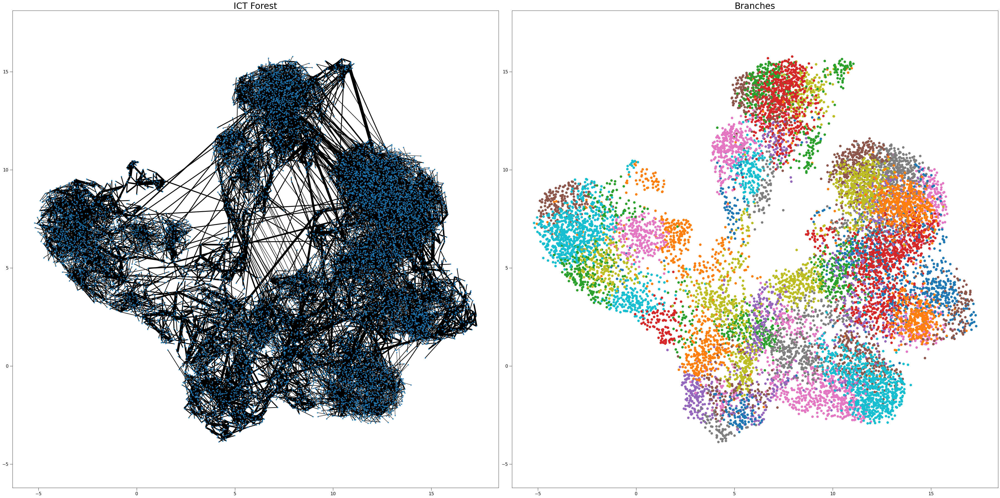

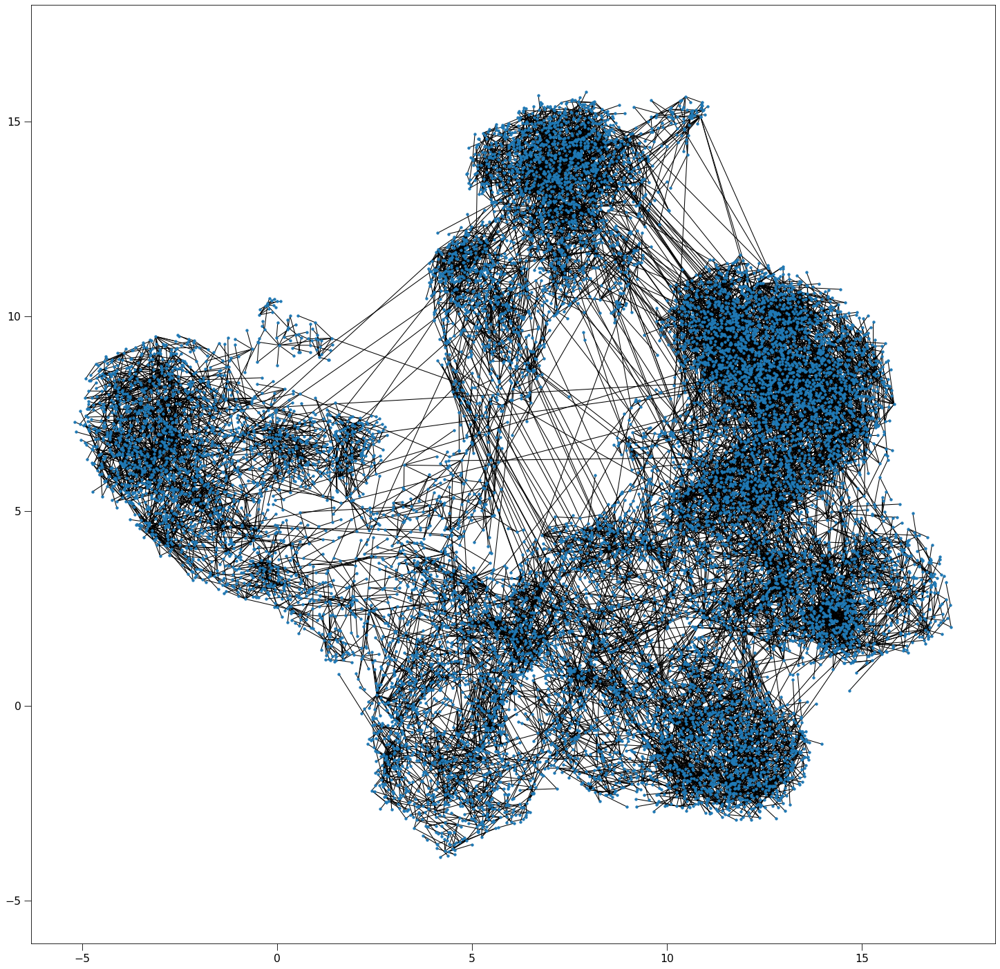

Patching the components together:   0%|          | 0/82 [00:00<?, ?it/s]

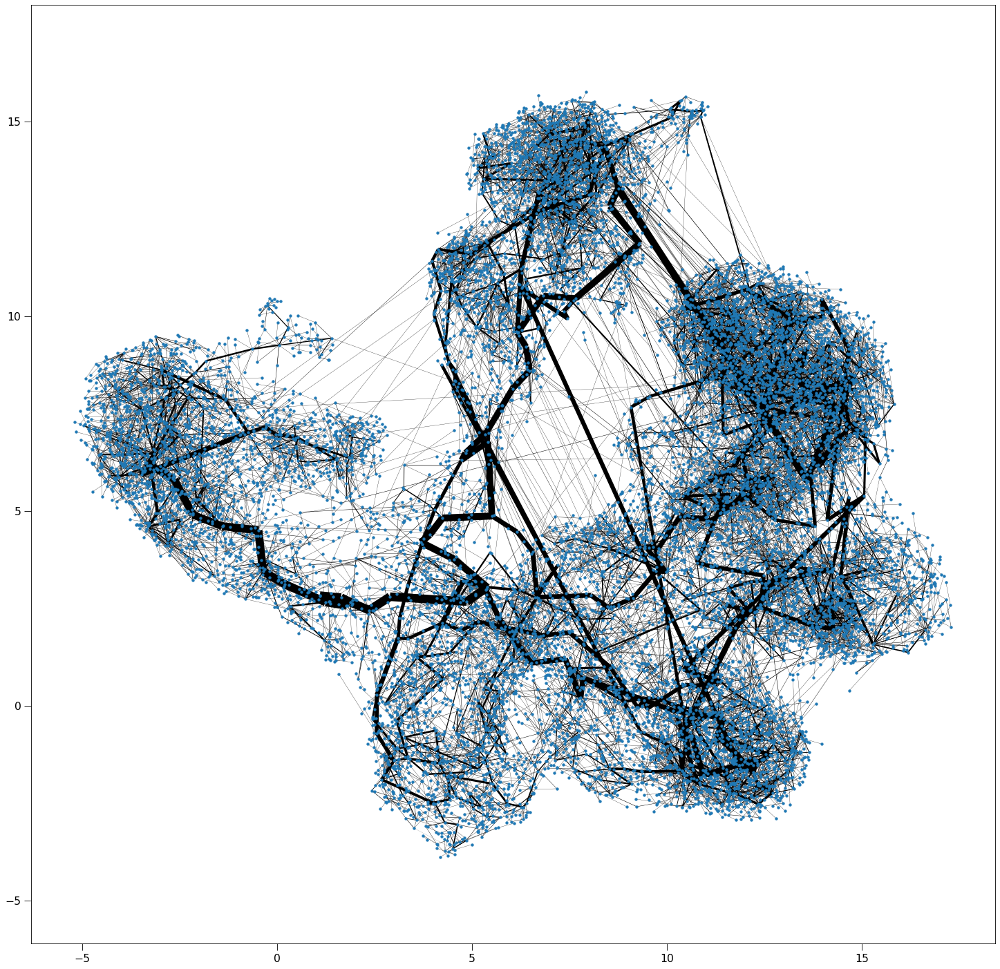

In [9]:
graphs = sub_ICTs
widths = []
for sub_ICT in sub_ICTs:
    if sub_ICT.numberOfNodes() == 1:
        widths.append([])
        continue
    widths.append(compute_widths(sub_ICT))
    
names = ["ICT Forest", "Branches"]

number_of_plots = 2
fig, ax = plt.subplots(1,2, figsize=(24*2,24))

for i, component in enumerate(components):
    nk.viztasks.drawGraph(graphs[i], pos=embedding[component], ax=ax[0], width=widths[i], node_size=10)
            

for component in components:
    ax[1].plot(*embedding[component].T)
    
for i, name in enumerate(names):
    ax[i].set_title(name)
    ax[i].axis("equal")
    ax[i].tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
    ax[i].set_axis_on()
    
    
plt.tight_layout()
plt.show()

from sklearn.metrics import pairwise_distances

G = nk.graph.Graph(n=len(position), weighted=True)

distances = pairwise_distances(position, position)

for component, sub_ICT in zip(components, sub_ICTs):
    for u, v, w in sub_ICT.iterEdgesWeights():
        nodeA = component[u]
        nodeB = component[v]
        G.addEdge(nodeA, nodeB, distances[nodeA, nodeB])
        
# plot the not connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()


##############################
           # new #           #
##############################
good_edges = []              #
for u, v in G.iterEdges():   #
    good_edges.append([u,v]) #
############################## 


G = patch_together(G, pca, 4)
G.indexEdges()

# plot the connected graph
fig, ax = plt.subplots(1, figsize=(24,24))
nk.viztasks.drawGraph(G, pos=embedding, ax=ax, width=compute_widths(G), node_size=10)
ax.tick_params(left=True, bottom=True, labelleft=True, labelbottom=True)
ax.set_axis_on()
ax.axis("equal")
plt.show()

## Cluster ICT

In [10]:
# calculate the cluster ICT with all aim nodes
start = time.time()
ICT = calculate_ICT(G, algorithm_type="cluster_all", cluster_centers=cluster_centers,
                                zeros_stay_zeros=True, update_G=1.1, good_edges=good_edges)
ICT.indexEdges()

create edgeId array:   0%|          | 0/13896 [00:00<?, ?it/s]

Calculate the lower bound for the weights:   0%|          | 0/13896 [00:00<?, ?it/s]

Iteration over all nodes:   0%|          | 0/13706 [00:00<?, ?it/s]

update Arr 13896 -> 13716
update Arr 13716 -> 13714
update Arr 13714 -> 13714
update Arr 13714 -> 13714
update Arr 13714 -> 13713
update Arr 13713 -> 13711
update Arr 13711 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13710
update Arr 13710 -> 13709
update Arr 13709 -> 13708
update Arr 13708 -> 13706
added 14 edges early


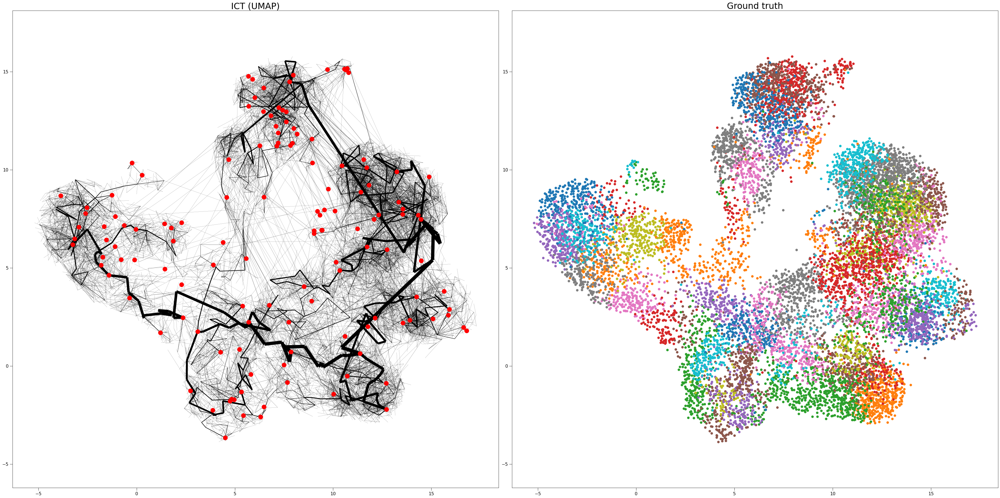

In [11]:
fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))

plot_graph(ICT, embedding, "ICT (UMAP)", ax1, cluster_centers, node_size=0)
plot_points(embedding, "Ground truth", ax2, labels)

ax2.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-UMAP-"+parameters+".png")

plt.show()

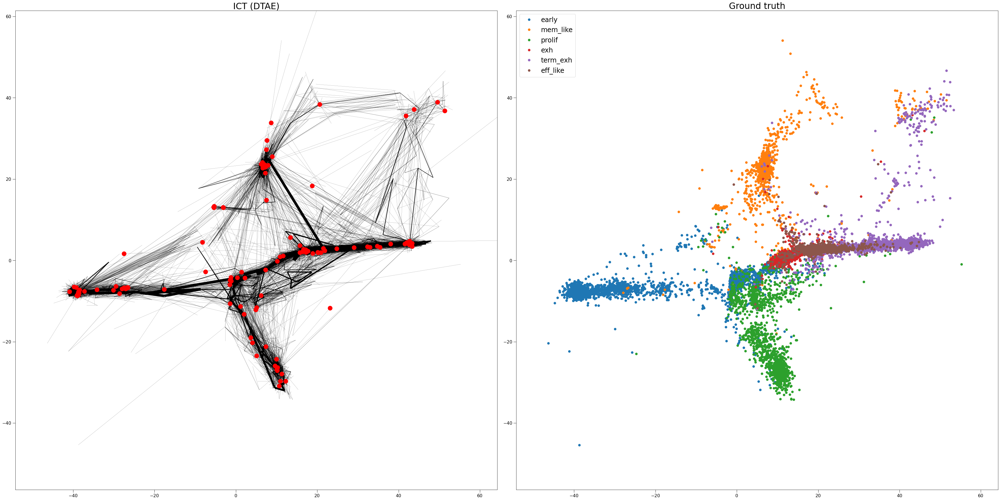

In [12]:
if (dataset == "pancreas_reduced") or (dataset == "pancreas_full") or (dataset=="eth_CC"):
    if dataset == "pancreas_reduced":
        dtae_embedding, dtae_labels = data_loader("pancreas_reduced_DTAE_embedding")
        
    elif dataset == "pancreas_full":
        dtae_embedding, dtae_labels = data_loader("pancreas_full_DTAE_embedding")
        
    elif dataset=="eth_CC":
        dtae_embedding, dtae_labels = data_loader("CC_DTAE_embedding")
    
    else:
        raise RuntimeError("Something went definitively wrong!?")
        
        
    fig, (ax1, ax2) = plt.subplots(1,2, figsize=(24*2,24))
    plot_graph(ICT, dtae_embedding, "ICT (DTAE)", ax1, cluster_centers, node_size=0)
    plot_points(dtae_embedding, "Ground truth", ax2, dtae_labels)
    
    if dataset == "eth_CC":
        ax1.set_xlim([-50,60])
        ax2.set_xlim([-50,60])
        ax1.set_ylim([-45,50])
        ax2.set_ylim([-45,50])
    
    plt.tight_layout()
    plt.savefig("./Output/Images/"+dataset+"-DTAE-"+parameters+".png")
    plt.show()

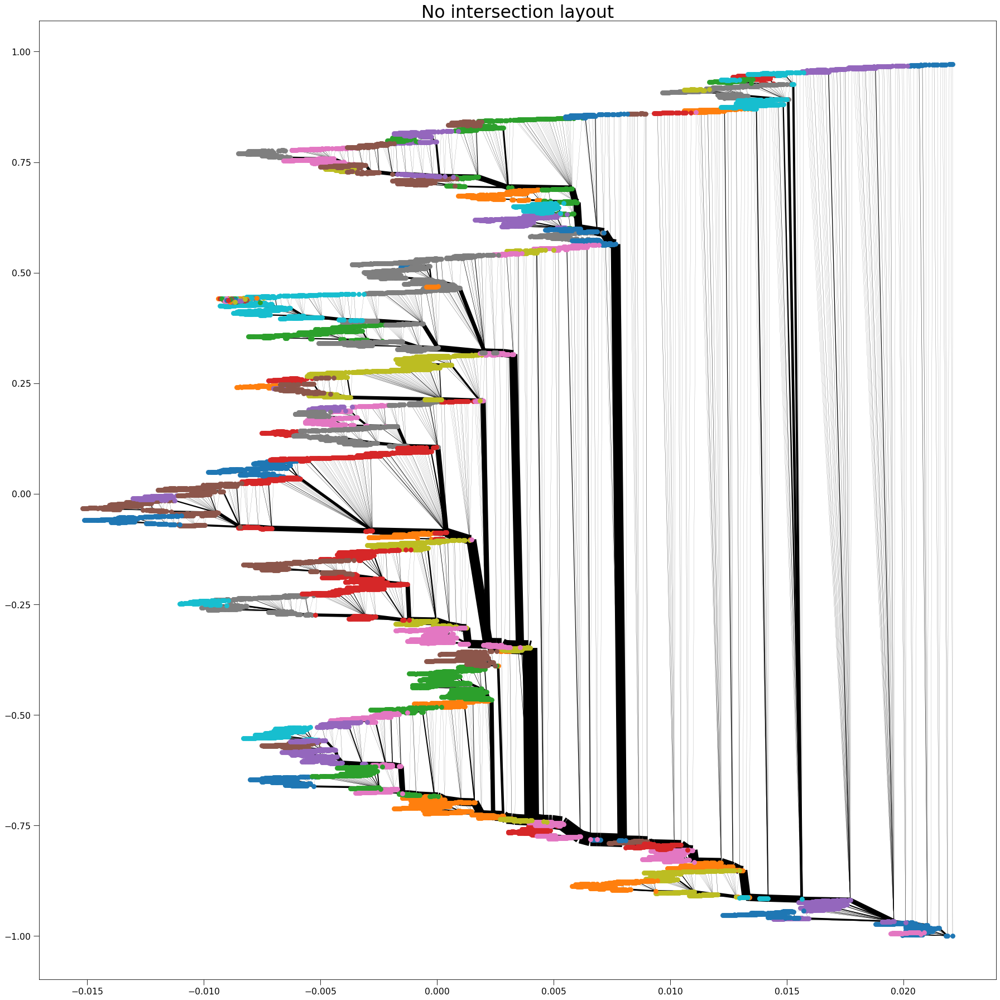

In [13]:
fig, ax = plt.subplots(1, figsize=(24,24))
no_intersections(ICT, embedding, ax, labels)
ax.get_legend().remove()
plt.tight_layout()
plt.savefig("./Output/Images/"+dataset+"-no-intersection-"+parameters+".png")
plt.show()